In [15]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.tree import DecisionTreeRegressor , plot_tree
from sklearn.metrics import mean_absolute_error , mean_squared_error , r2_score

import seaborn as sns
import matplotlib.pyplot as plt

### Data Gathering

In [2]:
df = pd.read_csv('Housing_V1.csv')
df

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420.0,4,2,3,1,0,0,0,1,2,1,2
1,12250000,8960.0,4,4,4,1,0,0,0,1,3,0,2
2,12250000,9960.0,3,2,2,1,0,1,0,0,2,1,1
3,12215000,7500.0,4,2,2,1,0,1,0,1,3,1,2
4,11410000,7420.0,4,1,2,1,1,1,0,1,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
540,1820000,3000.0,2,1,1,1,0,1,0,0,2,0,0
541,1767150,2400.0,3,1,1,0,0,0,0,0,0,0,1
542,1750000,3620.0,2,1,1,1,0,0,0,0,0,0,0
543,1750000,2910.0,3,1,1,0,0,0,0,0,0,0,2


### Model Training

In [4]:
x = df.drop('price',axis=1)
y = df['price']

x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=0.2 , random_state=32)

In [6]:
dt_reg = DecisionTreeRegressor()

In [7]:
dt_reg.fit(x_train,y_train)

DecisionTreeRegressor()

In [11]:
plt.figure(figsize=(300,200))
plot_tree(dt_reg,feature_names=x.columns,filled=True)
plt.savefig('DecisionTree.png')

### Model Evaluation

In [13]:
#Training data evaluation

y_train_pred = dt_reg.predict(x_train)

mae = mean_absolute_error(y_train , y_train_pred)
print("Mean absolute error : ",mae)

mse = mean_squared_error(y_train , y_train_pred)
print("Mean squared error : ",mse)

r2 = r2_score(y_train , y_train_pred)
print("R2 Score : ",r2)

Mean absolute error :  7722.477064220184
Mean squared error :  4479173165.137614
R2 Score :  0.9987257131877243


In [14]:
#Testing data evaluation

y_test_pred = dt_reg.predict(x_test)

mae = mean_absolute_error(y_test , y_test_pred)
print("Mean absolute error : ",mae)

mse = mean_squared_error(y_test , y_test_pred)
print("Mean squared error : ",mse)

r2 = r2_score(y_test , y_test_pred)
print("R2 Score : ",r2)

Mean absolute error :  957905.0458715596
Mean squared error :  1824483330940.367
R2 Score :  0.4632426270562069


### Hyperparameter Tunning

In [49]:
dt_reg = DecisionTreeRegressor(random_state=32)
parameters = ({"criterion" : ['absolute_error', 'squared_error'],
            "max_depth" : np.arange(3,10),
            "min_samples_split" : np.arange(5,20),
            "min_samples_leaf" : np.arange(2,10)})

gscv_dt_reg = GridSearchCV(dt_reg,parameters,n_jobs=-1,error_score='raise',cv=4)
gscv_dt_reg.fit(x_train,y_train)

GridSearchCV(cv=4, error_score='raise',
             estimator=DecisionTreeRegressor(random_state=32), n_jobs=-1,
             param_grid={'criterion': ['absolute_error', 'squared_error'],
                         'max_depth': array([3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_leaf': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])})

In [50]:
gscv_dt_reg.best_estimator_

DecisionTreeRegressor(criterion='absolute_error', max_depth=6,
                      min_samples_leaf=7, min_samples_split=16,
                      random_state=32)

In [51]:
dt_reg = gscv_dt_reg.best_estimator_

In [52]:
dt_reg.fit(x_train,y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=6,
                      min_samples_leaf=7, min_samples_split=16,
                      random_state=32)

In [53]:
#Training data evaluation

y_train_pred = dt_reg.predict(x_train)

mae = mean_absolute_error(y_train , y_train_pred)
print("Mean absolute error : ",mae)

mse = mean_squared_error(y_train , y_train_pred)
print("Mean squared error : ",mse)

r2 = r2_score(y_train , y_train_pred)
print("R2 Score : ",r2)

Mean absolute error :  749065.504587156
Mean squared error :  1331847652003.6697
R2 Score :  0.6211006280985065


In [54]:
#Testing data evaluation

y_test_pred = dt_reg.predict(x_test)

mae = mean_absolute_error(y_test , y_test_pred)
print("Mean absolute error : ",mae)

mse = mean_squared_error(y_test , y_test_pred)
print("Mean squared error : ",mse)

r2 = r2_score(y_test , y_test_pred)
print("R2 Score : ",r2)

Mean absolute error :  786694.0366972478
Mean squared error :  1178794147454.1284
R2 Score :  0.6532023948375132


In [55]:
dt_reg.feature_importances_

array([0.44177303, 0.03145559, 0.17224615, 0.01145651, 0.01434803,
       0.        , 0.02330902, 0.        , 0.07461675, 0.05187409,
       0.06176554, 0.11715528])

<Axes: >

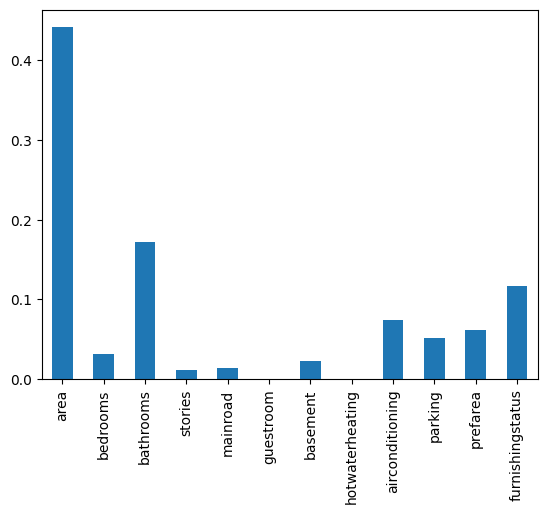

In [57]:
s1 = pd.Series(dt_reg.feature_importances_ , index=x.columns)
s1.plot(kind='bar')

### Pruning

In [47]:
dt_reg = DecisionTreeRegressor(random_state=32 )

path = dt_reg.cost_complexity_pruning_path(x_train,y_train)
ccp_alphas , _ = path.ccp_alphas , path.impurities
ccp_alphas

array([0.00000000e+00, 5.61926606e+04, 5.61926606e+04, 5.61926606e+04,
       1.40481651e+06, 1.40481651e+06, 1.40481651e+06, 1.40481651e+06,
       1.40481651e+06, 1.40481651e+06, 1.87308869e+06, 2.75344037e+06,
       3.59633028e+06, 4.55160550e+06, 4.55160550e+06, 5.61926606e+06,
       5.61926606e+06, 5.61926606e+06, 5.61926606e+06, 5.61926606e+06,
       5.61926606e+06, 5.61926606e+06, 5.61926606e+06, 5.61926606e+06,
       6.79931193e+06, 6.79931193e+06, 6.79931193e+06, 8.09174312e+06,
       8.42889908e+06, 1.12385321e+07, 1.17068043e+07, 1.21750765e+07,
       1.26433486e+07, 1.26433486e+07, 1.26433486e+07, 1.26433486e+07,
       1.26433486e+07, 1.26433486e+07, 1.26433486e+07, 1.35237003e+07,
       1.46850153e+07, 1.82064220e+07, 2.16529052e+07, 2.24770642e+07,
       2.24770642e+07, 2.24770642e+07, 2.24770642e+07, 2.24770642e+07,
       2.24770642e+07, 2.24770642e+07, 2.29453364e+07, 2.29453364e+07,
       2.29453364e+07, 2.47809633e+07, 2.47809633e+07, 2.83304664e+07,
      

Text(0.5, 1.0, 'COMPARISION')

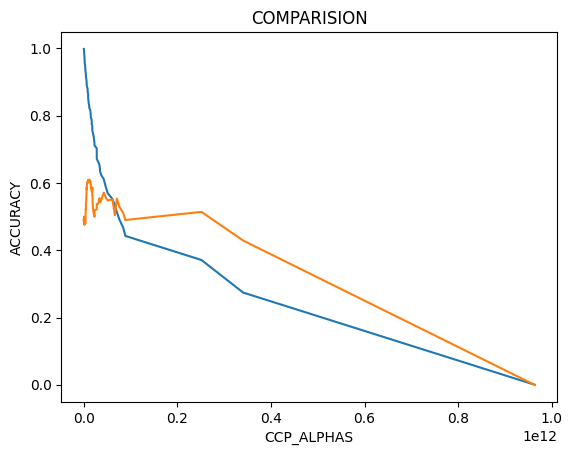

In [41]:
train_acc_list = []
test_acc_list = []

for ccp_alpha in ccp_alphas:
    dt_reg = DecisionTreeRegressor(random_state=32,ccp_alpha=ccp_alpha)
    dt_reg.fit(x_train,y_train)
    train_acc = dt_reg.score(x_train,y_train)
    train_acc_list.append(train_acc)
    
    test_acc = dt_reg.score(x_test,y_test)
    test_acc_list.append(test_acc)
    
plt.plot(ccp_alphas,train_acc_list)
plt.plot(ccp_alphas,test_acc_list)
plt.xlabel('CCP_ALPHAS')
plt.ylabel('ACCURACY')
plt.title('COMPARISION')